# Assignment 2     
# DATA MINING
# i212682 - DS(M)

In [2]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('data_amazon3.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)


Null values in each column:
Product Title         0
Product Link          0
Price              2903
Rating              712
Image Link            0
Extra Images       2880
About This Item     943
Seller Name         729
Reviews            2372
Product ID         1429
Gender              146
Sub-category        146
Category              0
dtype: int64


In [3]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('data_amazon3.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 6341


In [4]:
import pandas as pd

# Assuming you've already read your data from a JSON file into a DataFrame called df
# If not, replace 'input.json' with the path to your JSON file
df = pd.read_json('data_amazon3.json')

# Display the DataFrame
print(df)


                                          Product Title   
0     Men's Women's Air J 4 Retro high top Shoes Men...  \
1     Fashion Basketball Sneakers Retro red Thunder ...   
2     VELAASA Raptor | Cross Training Shoe | Versati...   
3     Men's Business Work Leather Covered Upper Offi...   
4     Timberland PRO Men's Mudsill Steel Safety Toe ...   
...                                                 ...   
6336  Timberland Women's Leather RFID Flap Wallet Cl...   
6337  Vera Bradley Women's Protection Microfiber RFI...   
6338  Anna by Anuschka Women's Hand Painted Genuine ...   
6339  Nautica Women's Perfect Carry-All Money Manage...   
6340  Vera Bradley Women's Microfiber Zip Id Case Wa...   

                                           Product Link   
0     https://www.amazon.com/sspa/click?ie=UTF8&spc=...  \
1     https://www.amazon.com/sspa/click?ie=UTF8&spc=...   
2     https://www.amazon.com/sspa/click?ie=UTF8&spc=...   
3     https://www.amazon.com/sspa/click?ie=UTF8&spc=...

In [ ]:
# product id 

In [8]:
import pandas as pd

# Assuming you've already read your data from a JSON file into a DataFrame called df
df = pd.read_json('data_amazon3.json')

# Drop rows with null product IDs
df = df.dropna(subset=['Product ID'])

df.to_json('pid_amazon.json', orient='records')


In [9]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)



Number of rows in the dataset: 4912


In [10]:


# Read the JSON file into a DataFrame
df = pd.read_json('pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)


Null values in each column:
Product Title         0
Product Link          0
Price              1953
Rating              662
Image Link            0
Extra Images       2510
About This Item     835
Seller Name         679
Reviews            2068
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [11]:
import pandas as pd

# Assuming you've already read your data from a JSON file into a DataFrame called df
# If not, replace 'input.json' with the path to your JSON file
df = pd.read_json('pid_amazon.json')

# Display the DataFrame
print(df)


                                          Product Title   
0     Timberland PRO Men's Mudsill Steel Safety Toe ...  \
1                    ARIAT Men's Quickdraw Western Boot   
2     Timberland PRO Men's Direct Attach 6 Inch Soft...   
3              ECCO Men's Ultra Terrain Low Hiking Shoe   
4     Dexter Men's Athletic Roger II Bowling Shoes-B...   
...                                                 ...   
4907  Vera Bradley Women's Performance Twill Deluxe ...   
4908  Loungefly Disney: Stitch Pineapple Wallet, Ama...   
4909  Loungefly Villains: Lion King - Scar Wallet, A...   
4910  Nautica Women's Perfect Carry-All Money Manage...   
4911  Vera Bradley Women's Microfiber Zip Id Case Wa...   

                                           Product Link    Price    Rating   
0     https://www.amazon.com/Timberland-PRO-Mudsill-...   $79.63  Previous  \
1     https://www.amazon.com/Ariat-Quickdraw-Western...  $214.95       4.6   
2     https://www.amazon.com/Timberland-PRO-Six-Inch...  

In [ ]:
#seller name 


In [12]:
import pandas as pd

# Assuming you've already read your data from a JSON file into a DataFrame called df
df = pd.read_json('pid_amazon.json')

# Select rows where 'Seller Name' is null
missing_seller_name = df[df['Seller Name'].isnull()]

# Display the selected rows
print(missing_seller_name)


                                          Product Title   
261         Men's Biom 2.1 X MTN M Mid GTX Fashion Boot  \
788       Trina Turk Women's Puff Sleeve Structured Top   
789   Nautica Women's Classic Fit Crew-Neck J-Class ...   
790                 Theory Women's Romantic Blouse.Mode   
791   Tommy Hilfiger Women's Blouse Casual Check Rol...   
...                                                 ...   
4845  Ralph by Ralph Lauren Women's Ra7129 Butterfly...   
4846  Coach Women's Hc6210u Universal Fit Round Pres...   
4847  Costa Del Mar Women's Ocean Ridge 230 Cat Eye ...   
4848         Levi's Women's Lv 5006/S Square Sunglasses   
4849  Emporio Armani Women's EA3193 Cat Eye Sunglass...   

                                           Product Link    Price Rating   
261   https://www.amazon.com/ECCO-Gore-TEX-Waterproo...  $155.97    4.3  \
788   https://www.amazon.com/Trina-Turk-Womens-Sleev...     None   None   
789   https://www.amazon.com/Nautica-Classic-Crew-Ne...     None  

In [44]:
import pandas as pd
import json

# Load your DataFrame
df = pd.read_json('pid_amazon.json')

# Load the first two words from first_two_words.json
with open('seller_name.json', 'r') as file:
    first_two_words_data = json.load(file)
    first_two_words_list = first_two_words_data['2 words']  #the key col is '2 words'

# Find indices where 'Seller Name' is null
null_indices = df[df['Seller Name'].isnull()].index

# Replace null values in 'Seller Name' column with first two words in order
word_index = 0
for index in null_indices:
    df.at[index, 'Seller Name'] = first_two_words_list[word_index]
    word_index = (word_index + 1) % len(first_two_words_list)  # Move to the next word cyclically

# Save the updated DataFrame to a JSON file
df.to_json('seller_pid_amazon.json', orient='records')

print("DataFrame saved to seller_pid_amazon.json")


DataFrame saved to seller_pid_amazon.json


In [45]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('seller_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [17]:
# nooo
df['Seller Name'].fillna('Not Available', inplace=True)

# Save the DataFrame to a JSON file
df.to_json('pid_amazon.json', orient='records')

print("DataFrame saved to pid_amazon.json")




DataFrame saved to pid_amazon.json


In [46]:
# Read the JSON file into a DataFrame
df = pd.read_json('seller_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title         0
Product Link          0
Price              1953
Rating              662
Image Link            0
Extra Images       2510
About This Item     835
Seller Name           0
Reviews            2068
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [47]:
import pandas as pd

# Assuming you've already read your data from a JSON file into a DataFrame called df
df = pd.read_json('seller_pid_amazon.json')

# Select rows where 'Seller Name' is null
missing_seller_name = df[df['Seller Name'].isnull()]

# Display the selected rows
print(missing_seller_name)


Empty DataFrame
Columns: [Product Title, Product Link, Price, Rating, Image Link, Extra Images, About This Item, Seller Name, Reviews, Product ID, Gender, Sub-category, Category]
Index: []


In [ ]:
#where seller name is null extract product link to get seller name .....before above

In [13]:
df = pd.read_json('pid_amazon.json')

# Select rows where 'Seller Name' is null
missing_seller_name = df[df['Seller Name'].isnull()]

# Extract the 'Product ID' column for the selected rows
missing_seller_product_ids = missing_seller_name['Product Link']

# Display the product IDs
print(missing_seller_product_ids)
# Save the product IDs to a JSON file
missing_seller_product_ids.to_json('BN_productlinks.json', orient='records')


261     https://www.amazon.com/ECCO-Gore-TEX-Waterproo...
788     https://www.amazon.com/Trina-Turk-Womens-Sleev...
789     https://www.amazon.com/Nautica-Classic-Crew-Ne...
790     https://www.amazon.com/Theory-womens-Romantic-...
791     https://www.amazon.com/Tommy-Hilfiger-Womens-B...
                              ...                        
4845    https://www.amazon.com/Ralph-Lauren-RA7129-But...
4846    https://www.amazon.com/Coach-HC6210U-Universal...
4847    https://www.amazon.com/Costa-Del-Mar-6S8009-Pr...
4848    https://www.amazon.com/Levis-Timeless-Female-s...
4849    https://www.amazon.com/Emporio-Armani-Womens-E...
Name: Product Link, Length: 679, dtype: object


In [14]:
import re
import json

# Load the JSON file
with open('BN_productlinks.json', 'r') as file:
    data = json.load(file)

# Define a regular expression pattern to extract brand names
pattern = r'\/([A-Z][A-Za-z0-9-]+)-'

# Function to extract brand names from Amazon product links
def extract_brand_name(link):
    match = re.search(pattern, link)
    if match:
        return match.group(1)
    else:
        return None

# Extract brand names from each Amazon product link
brand_names = [extract_brand_name(link) for link in data]

# Remove None values from the list (for links where brand name couldn't be extracted)
brand_names = [brand for brand in brand_names if brand is not None]

# Print the list of brand names
print(brand_names)




['ECCO-Gore-TEX-Waterproof-Trainer-10-10', 'Trina-Turk-Womens-Sleeve', 'Nautica-Classic-Crew-Neck-J-Class-T', 'Theory-womens-Romantic-Blouse-mode', 'Tommy-Hilfiger-Womens-Blouse', 'ZAFUL-Lace-up-Cropped-Bandana', 'Amazon-Essentials-Womens-Classic', 'DKNY-Womens-Sleeveless-Pleated', 'Drop-Womens-Short-Sleeve-Cropped-T', 'Amazon-Essentials-Classic-Crewneck-T', 'IZOD-Juniors-Uniform-Performance-Large', 'Coach-Womens-Signature-Scarf', 'Coach-Womens-Signature-Scarf', 'Coach-VINTAGE-SIGNATURE-PRINTED', 'Coach-HORSE-CARRIAGE-PRINTED', 'MISSION-Cooling-Neck-Gaiter', 'Tickled-Pink-Womens-Scarf', 'Concept-One-Superman-Multi-Purpose', 'Department-56-6004411-Snowman', 'Hadley-Wren-Womens-Collection', 'Shakespearin-Ulagam-Nagaichuvai-Naadagangal', 'Panmuga-Parvaiyil-Tagore-Tamil', 'Armani-Exchange-Embossed-Pullover', 'Armani-Exchange-Pocket-Hooded', 'Armani-Exchange-Stretch-Hooded', 'Armani-Exchange-Embossed-Pullover', 'Armani-Exchange-Pocket-Hooded', 'Armani-Exchange-Paint-Brush', 'Armani-Exchange

In [37]:
import re
import json

# Load the JSON file
with open('BN_productlinks.json', 'r') as file:
    data = json.load(file)

# Define a regular expression pattern to extract brand names
pattern = r'\/([A-Z][A-Za-z0-9-]+)-'

# Function to extract brand names and return the first two words
def extract_brand_name(link):
    match = re.search(pattern, link)
    if match:
        brand_name = match.group(1)
        # Split the brand name by spaces and return the first two words
        return " ".join(brand_name.split()[:1])  # Limit to first two words
    else:
        return None

# Extract brand names from each Amazon product link
brand_names = [extract_brand_name(link) for link in data]

# Remove None values from the list
brand_names = [brand for brand in brand_names if brand is not None]

# Print the list of first two words
print(brand_names)


['ECCO-Gore-TEX-Waterproof-Trainer-10-10', 'Trina-Turk-Womens-Sleeve', 'Nautica-Classic-Crew-Neck-J-Class-T', 'Theory-womens-Romantic-Blouse-mode', 'Tommy-Hilfiger-Womens-Blouse', 'ZAFUL-Lace-up-Cropped-Bandana', 'Amazon-Essentials-Womens-Classic', 'DKNY-Womens-Sleeveless-Pleated', 'Drop-Womens-Short-Sleeve-Cropped-T', 'Amazon-Essentials-Classic-Crewneck-T', 'IZOD-Juniors-Uniform-Performance-Large', 'Coach-Womens-Signature-Scarf', 'Coach-Womens-Signature-Scarf', 'Coach-VINTAGE-SIGNATURE-PRINTED', 'Coach-HORSE-CARRIAGE-PRINTED', 'MISSION-Cooling-Neck-Gaiter', 'Tickled-Pink-Womens-Scarf', 'Concept-One-Superman-Multi-Purpose', 'Department-56-6004411-Snowman', 'Hadley-Wren-Womens-Collection', 'Shakespearin-Ulagam-Nagaichuvai-Naadagangal', 'Panmuga-Parvaiyil-Tagore-Tamil', 'Armani-Exchange-Embossed-Pullover', 'Armani-Exchange-Pocket-Hooded', 'Armani-Exchange-Stretch-Hooded', 'Armani-Exchange-Embossed-Pullover', 'Armani-Exchange-Pocket-Hooded', 'Armani-Exchange-Paint-Brush', 'Armani-Exchange

In [15]:
import json

# Assuming brand_names is a list containing the first two words

# Create a dictionary with a single key-value pair
data = {'2words': brand_names}

# Save the dictionary to a JSON file
with open('first_two_words.json', 'w') as file:
    json.dump(data, file, indent=2)  # Add indentation for readability

print("List of first two words saved to first_two_words.json")


List of first two words saved to first_two_words.json


In [31]:
# Save the list of first two words to a JSON file
with open('first_two_words.json', 'w') as file:
    json.dump(brand_names, file, indent=2)  # Add indentation for readability

print("List of first two words saved to first_two_words.json")

List of first two words saved to first_two_words.json


In [38]:
import json

# Load the data from the JSON file
with open('first_two_words.json', 'r') as file:
    data = json.load(file)

# Extract the first word of each entry
first_words = [entry.split('-')[0] for entry in data]

# Print the first words
print(first_words)


['ECCO', 'Trina', 'Nautica', 'Theory', 'Tommy', 'ZAFUL', 'Amazon', 'DKNY', 'Drop', 'Amazon', 'IZOD', 'Coach', 'Coach', 'Coach', 'Coach', 'MISSION', 'Tickled', 'Concept', 'Department', 'Hadley', 'Shakespearin', 'Panmuga', 'Armani', 'Armani', 'Armani', 'Armani', 'Armani', 'Armani', 'Armani', 'Armani', 'ARMANI', 'Armani', 'Armani', 'Exchange', 'Armani', 'Marvel', 'Patricks', 'Volcom', 'VELVET', 'Monrow', 'Drop', 'Harry', 'Drop', 'Drop', 'Jockey', 'Disney', 'True', 'Nautica', 'Tommy', 'Vera', 'ARMANI', 'DKNY', 'Splendid', 'Vera', 'Summer', 'Tommy', 'Under', 'Daily', 'Oakley', 'Emperors', 'Tommy', 'Cutter', 'Agan', 'Skechers', 'GaryGraham422', 'Drop', 'Goodthreads', 'Virginia', 'Volcom', 'Wildfox', 'FKEEP', 'Tommy', 'DKNY', 'Drop', 'Roxy', 'Calvin', 'Volcom', 'Billabong', 'PAIGE', 'Tommy', 'Cutter', 'Roxy', 'Daily', 'Vantage', 'Danskin', 'Volcom', 'Velvet', 'Lucky', 'Barefoot', 'STAR', 'Drop', 'Zac', 'Star', 'Helly', 'DKNY', 'Drop', 'Wildfox', 'Disney', 'City', 'Bella', 'Oakley', 'Vantage',

In [42]:
#nooooooooo
import json

# Load the data from the JSON file
with open('first_two_words.json', 'r') as file:
    data = json.load(file)

# Extract the first word of each entry
first_words = [entry.split('-')[0] for entry in data]

# Save the first words to a new JSON file named 'seller_name.json'
with open('seller_name.json', 'w') as file:
    json.dump(first_words, file, indent=2)  # Saving just the first words, not a dictionary

print("List of first words saved to seller_name.json")


List of first words saved to seller_name.json


In [ ]:
# selecting brand name from file and saving it to a file

In [43]:
import json

# Load the data from the JSON file
with open('first_two_words.json', 'r') as file:
    data = json.load(file)

# Extract the first word of each entry
first_words = [entry.split('-')[0] for entry in data]

# Create a dictionary with a single key-value pair
data_to_save = {'2 words': first_words}

# Save the dictionary to a JSON file
with open('seller_name.json', 'w') as file:
    json.dump(data_to_save, file, indent=2)  # Add indentation for readability

print("List of first words saved to seller_name.json")


List of first words saved to seller_name.json


In [ ]:
#noo

In [41]:
import json

# Assuming brand_names is a list containing the first two words

# Create a dictionary with a single key-value pair
data = {'2words': brand_names}

# Save the dictionary to a JSON file
with open('seller_name.json', 'w') as file:
    json.dump(data, file, indent=2)  # Add indentation for readability

print("List of first two words saved to seller_name.json")


List of first two words saved to seller_name.json


In [26]:
# Save the first words to a JSON file
with open('seller_name.json', 'w') as file:
    json.dump(first_words, file)

print("First words saved to seller_name.json")

First words saved to seller_name.json


In [27]:
#noooo
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('pid_amazon.json')

# Filter the DataFrame to select rows where 'Seller Name' is 'Not Available'
not_available_rows = df[df['Seller Name'] == 'Not Available']

# Save the filtered DataFrame to a JSON file
not_available_rows.to_json('not_available_seller.json', orient='records')

print("Filtered data saved to not_available_seller.json")


Filtered data saved to not_available_seller.json


In [ ]:
#--------------reviews 

In [13]:
import emoji

# Sample reviews with emojis
reviews = [
    "Great product! ❤️",
    "Not satisfied. 😞",
    "👍",
    "Nice item! 👌🏼"
]

for review in reviews:
    # Check if review contains emojis
    emojis = [c for c in review if c in emoji.UNICODE_EMOJI["en"]]
    if emojis:
        # Print statement based on emojis
        if "❤️" in emojis:
            print("Amazing product!")
        elif "👍" in emojis:
            print("Great!")
        elif "👌🏼" in emojis:
            print("Nice choice!")
        else:
            print("Unknown emoji sentiment")
    else:
        print("No emojis found in the review")

Unknown emoji sentiment
Unknown emoji sentiment
Great!
Unknown emoji sentiment


In [48]:
import random

# Predefined list of sample reviews
sample_reviews = [
    "Great product, highly recommended!",
    "Not satisfied with the quality.",
    "Average product, nothing special.",
    "Amazing value for the price.",
    "Poor customer service experience.",
    "Very happy with my purchase.",
    "Could be better, but not bad overall.",
    "Terrible product, avoid at all costs.",
    "Excellent customer service!",
    "Exactly as described, very pleased.",
    "Disappointed with the purchase.",
    "Impressive quality for the price.",
    "Fast shipping, great packaging.",
    "Highly disappointed, will not buy again.",
    "Perfect fit, exceeded expectations.",
    "Poorly made, started falling apart.",
    "Highly recommended, will buy again.",
    "Mediocre product, nothing special.",
    "Superb quality, worth every penny.",
    "Worst purchase ever, regret buying it."
]

# Load the data from pid_amazon.json into a DataFrame
df = pd.read_json('seller_pid_amazon.json')

# Replace null values in the 'Reviews' column with random text reviews
# Generate 20 additional random reviews
additional_reviews = [random.choice(sample_reviews) for _ in range(20)]
df['Reviews'].fillna(random.choice(sample_reviews), inplace=True)

# Save the DataFrame to review_amazon.json
df.to_json('RS_pid_amazon.json', orient='records')

print("Random text reviews generated and saved to RS_pid_amazon.json")



Random text reviews generated and saved to RS_pid_amazon.json


In [49]:
# Read the JSON file into a DataFrame
df = pd.read_json('RS_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title         0
Product Link          0
Price              1953
Rating              662
Image Link            0
Extra Images       2510
About This Item     835
Seller Name           0
Reviews               0
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [50]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('RS_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [ ]:
#----------------PRICE

In [56]:
import pandas as pd
import re

# Load the data from 'pid_amazon.json' into a DataFrame
df = pd.read_json('RS_pid_amazon.json')

# Remove non-numeric characters and dollar signs from the 'Price' column
df['Price'] = df['Price'].str.replace(r'[^0-9.]', '', regex=True)

# Convert the 'Price' column to numeric data type, coerce errors to NaN
df['Price'] = pd.to_numeric(df['Price'], errors='coerce')

# Calculate the mean of the 'Price' column
mean_price = df['Price'].mean()

# Replace null values in the 'Price' column with the calculated mean
df['Price'].fillna(mean_price, inplace=True)

# Save the updated DataFrame to 'pid_amazon.json'
df.to_json('RSP_pid_amazon.json', orient='records')

print("Null values in the 'Price' column replaced with the mean and saved to 'pid_amazon.json'.")


Null values in the 'Price' column replaced with the mean and saved to 'pid_amazon.json'.


In [57]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('RSP_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [58]:

df = pd.read_json('RSP_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title         0
Product Link          0
Price                 0
Rating              662
Image Link            0
Extra Images       2510
About This Item     835
Seller Name           0
Reviews               0
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [ ]:
#------------------RATING HANDELING

In [60]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Load the dataset
df = pd.read_json('RSP_pid_amazon.json')

# Remove non-numeric values from the 'Rating' column
df['Rating'] = pd.to_numeric(df['Rating'], errors='coerce')

# Initialize the imputer with the 'mean' strategy
imputer = SimpleImputer(strategy='mean')

# Fit and transform the 'Rating' column
df['Rating'] = imputer.fit_transform(df[['Rating']])

# Save the updated DataFrame
df.to_json('RSPr_pid_amazon.json', orient='records')

print(" values in the 'Rating' column have been HANDELED")


 values in the 'Rating' column have been HANDELED


In [61]:
# Read the JSON file into a DataFrame
df = pd.read_json('RSPr_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title         0
Product Link          0
Price                 0
Rating                0
Image Link            0
Extra Images       2510
About This Item     835
Seller Name           0
Reviews               0
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [62]:
import pandas as pd

# Read the JSON file into a DataFrame
df = pd.read_json('RSPr_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [ ]:
#-----------description cleaning

In [63]:



df = pd.read_json('RSPr_pid_amazon.json')

df['About This Item'].fillna('Not Available', inplace=True)

# Save the updated DataFrame
df.to_json('RSPrd_pid_amazon.json', orient='records')

print("description ")


description 


In [65]:

df = pd.read_json('RSPrd_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title         0
Product Link          0
Price                 0
Rating                0
Image Link            0
Extra Images       2510
About This Item       0
Seller Name           0
Reviews               0
Product ID            0
Gender                0
Sub-category          0
Category              0
dtype: int64


In [66]:

df = pd.read_json('RSPrd_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [51]:
# ----------images 

In [73]:
import pandas as pd

# Load the data from the JSON file
df = pd.read_json('RSPrd_pid_amazon.json')

# Create a list to store rows with missing 'Extra Images'
missing_images_rows = []

# Iterate over rows and generate dummy URLs for missing 'Extra Images'
for index, row in df.iterrows():
    if pd.isnull(row['Extra Images']):
        # Extract ASIN from the product link
        asin = row['Product Link'].split('/')[-2]
        # Construct dummy URL for image using ASIN
        dummy_url = f"https://m.media-amazon.com/images/{asin}._SS47_.jpg"
        # Update the 'Extra Images' value in the original DataFrame
        df.at[index, 'Extra Images'] = dummy_url
        # Append a copy of the updated row to the list
        missing_images_rows.append(df.loc[index].copy())

# Create a DataFrame from the list of rows with missing 'Extra Images'
missing_images_df = pd.DataFrame(missing_images_rows)

# Save the DataFrame with missing 'Extra Images' to a new JSON file
missing_images_df.to_json('RSPrdi_id_amazon.json', orient='records')


In [76]:
import pandas as pd

# Load the data from the JSON file
df = pd.read_json('RSPrd_pid_amazon.json')

# Create a list to store rows with missing 'Extra Images'
missing_images_rows = []

# Iterate over rows and generate dummy URLs for missing 'Extra Images'
for index, row in df.iterrows():
    if pd.isnull(row['Extra Images']):
        # Extract ASIN from the product link
        asin = row['Product Link'].split('/')[-2]
        # Construct dummy URL for image using ASIN
        dummy_url = f"https://m.media-amazon.com/images/{asin}._SS47_.jpg"
        # Update the 'Extra Images' value in the original DataFrame
        df.at[index, 'Extra Images'] = dummy_url
        # Append a copy of the updated row to the list
        missing_images_rows.append(df.loc[index].copy())

# Save the updated DataFrame to the original JSON file
df.to_json('RSPrdi_pid_amazon.json', orient='records')

# Create a DataFrame from the list of rows with missing 'Extra Images'
missing_images_df = pd.DataFrame(missing_images_rows)

# Save the DataFrame with missing 'Extra Images' to a new JSON file
missing_images_df.to_json('RSPrdii_id_amazon.json', orient='records')


In [78]:
# Read the JSON file into a DataFrame
df = pd.read_json('RSPrdi_pid_amazon.json')

# Find null values in each column
null_counts = df.isnull().sum()

print("Null values in each column:")
print(null_counts)

Null values in each column:
Product Title      0
Product Link       0
Price              0
Rating             0
Image Link         0
Extra Images       0
About This Item    0
Seller Name        0
Reviews            0
Product ID         0
Gender             0
Sub-category       0
Category           0
dtype: int64


In [79]:
# Read the JSON file into a DataFrame
df = pd.read_json('RSPrdi_pid_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)


Number of rows in the dataset: 4912


In [58]:
#preprocessing

In [59]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# PREPROCESSING

In [80]:
import pandas as pd
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Load the cleaned data
df = pd.read_json('RSPrdi_pid_amazon.json')

# Lowercase the text columns
text_columns = ['Product Title', 'About This Item', 'Seller Name', 'Reviews','Gender','Category','Sub-category']
df[text_columns] = df[text_columns].apply(lambda x: x.str.lower())

# Remove special characters and tokenize text
def preprocess_text(text):
    # Remove special characters and keep only alphanumeric and whitespace characters
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    # Tokenize the text
    tokens = word_tokenize(text)
    return tokens

# Apply preprocessing to text columns
for col in text_columns:
    df[col] = df[col].apply(preprocess_text)

# Handle repeated letters
def handle_repeated_letters(tokens):
    # Convert excessive capitalization or repeated characters to standard format
    processed_tokens = []
    for token in tokens:
        # Remove repeated characters
        processed_token = re.sub(r'(.)\1{2,}', r'\1\1', token)
        processed_tokens.append(processed_token)
    return processed_tokens

# Apply handle_repeated_letters function to text columns
for col in text_columns:
    df[col] = df[col].apply(handle_repeated_letters)

# Lemmatization
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def lemmatize(tokens):
    # Lemmatize tokens and remove stop words
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]
    return lemmatized_tokens

# Apply lemmatization to text columns
for col in text_columns:
    df[col] = df[col].apply(lemmatize)

# Save the preprocessed data
df.to_json('preprocessed_amazon.json', orient='records')


In [83]:
# Read the JSON file into a DataFrame
df = pd.read_json('preprocessed_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)

Number of rows in the dataset: 4912


In [81]:
import pandas as pd
from scipy import stats

# Load the dataset
df = pd.read_json('preprocessed_amazon.json')

# Calculate Z-scores for numeric columns
numeric_columns = ['Price', 'Rating']  # Add other numeric columns as needed
z_scores = stats.zscore(df[numeric_columns])

# Set threshold for Z-score (e.g., 3 standard deviations)
threshold = 3

# Find outliers
outliers = (z_scores > threshold).any(axis=1)

# Display rows with outliers
print(df[outliers])


                                          Product Title   
1                [ariat, men, quickdraw, western, boot]  \
9     [dan, post, men, dorsal, square, toe, casual, ...   
60          [allen, edmonds, men, park, avenue, oxford]   
63                    [allen, edmonds, men, verona, ii]   
79          [ariat, men, futurity, time, western, boot]   
...                                                 ...   
3256              [vince, woman, poplin, bias, culotte]   
3277  [paige, woman, christy, duty, high, rise, tape...   
3283                   [vince, woman, satin, wide, leg]   
3385  [ag, adriano, goldschmied, men, tellis, modern...   
3399  [ag, adriano, goldschmied, men, tellis, modern...   

                                           Product Link   Price    Rating   
1     https://www.amazon.com/Ariat-Quickdraw-Western...  214.95  4.600000  \
9     https://www.amazon.com/Dan-Post-Dorsal-Tobacco...  221.84  4.700000   
60    https://www.amazon.com/Allen-Edmonds-Avenue-Ox...  324

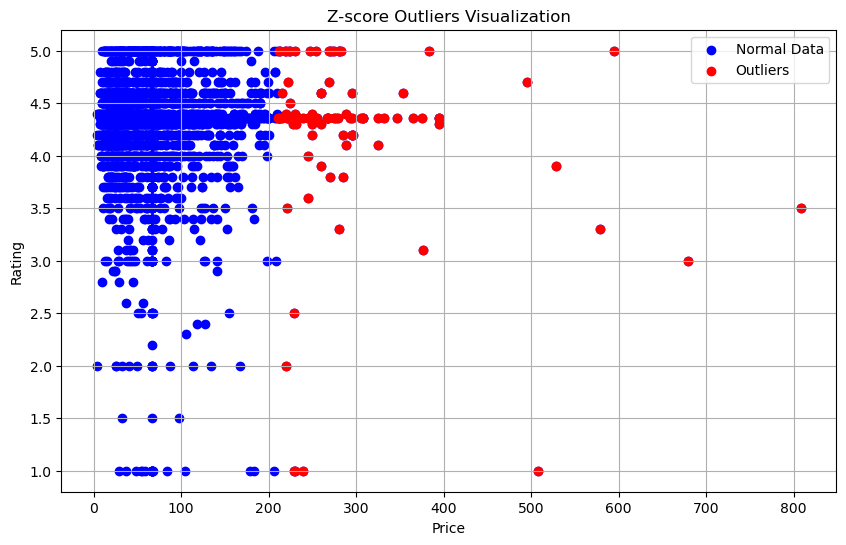

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Load the dataset
df = pd.read_json('preprocessed_amazon.json')

# Calculate Z-scores for numeric columns
numeric_columns = ['Price', 'Rating']  # Add other numeric columns as needed
z_scores = stats.zscore(df[numeric_columns])

# Set threshold for Z-score (e.g., 3 standard deviations)
threshold = 3

# Find outliers
outliers = (z_scores > threshold).any(axis=1)

# Extract outlier rows
outlier_data = df[outliers]

# Plotting
plt.figure(figsize=(10, 6))

# Plot all data points
plt.scatter(df['Price'], df['Rating'], color='blue', label='Normal Data')

# Highlight outliers
plt.scatter(outlier_data['Price'], outlier_data['Rating'], color='red', label='Outliers')

plt.title('Z-score Outliers Visualization')
plt.xlabel('Price')
plt.ylabel('Rating')
plt.legend()
plt.grid(True)
plt.show()


# HANDELING IMAGE IN FILE

In [72]:
import os
import json
import requests

# Create a folder to store the downloaded images
os.makedirs('product_images', exist_ok=True)

# Load the data from the processed JSON file
with open('preprocessed_amazon.json', 'r') as file:
    data = json.load(file)

# Iterate through the data
for item in data:
    product_id = item['Product ID']
    image_url = item['Image Link']
    
    # Check if the image URL is available
    if image_url:
        # Extract the image file extension (e.g., '.jpg', '.png')
        file_extension = image_url.split('.')[-1]
        
        # Generate the filename using the product ID
        filename = f'product_images/{product_id}.{file_extension}'
        
        try:
            # Download the image from the URL
            response = requests.get(image_url)
            response.raise_for_status()  # Raise an error for non-200 status codes
            
            # Save the image to the specified filename
            with open(filename, 'wb') as image_file:
                image_file.write(response.content)
                
            print(f"Image downloaded: {filename}")
        except Exception as e:
            print(f"Error downloading image for product ID {product_id}: {e}")
    else:
        print(f"No image URL available for product ID {product_id}")


Image downloaded: product_images/B0BSJZLF8D.jpg
Image downloaded: product_images/B000WG7RKI.jpg
Image downloaded: product_images/B01IT92Z0G.jpg
Image downloaded: product_images/B00SWVQ7GK.jpg
Image downloaded: product_images/B01I9XYR94.jpg
Image downloaded: product_images/B09LT1WWQT.jpg
Image downloaded: product_images/B09KT7P18X.jpg
Image downloaded: product_images/B08L8FPKKC.jpg
Image downloaded: product_images/B09XJB7DX4.jpg
Image downloaded: product_images/B0C5S3X7WF.jpg
Image downloaded: product_images/B093Y847KK.png
Image downloaded: product_images/B088ZT9JD3.jpg
Image downloaded: product_images/B08PDN2Y7W.jpg
Image downloaded: product_images/B08779QD7V.jpg
Image downloaded: product_images/B01N9O1O7P.jpg
Image downloaded: product_images/B07PW2N6RK.jpg
Image downloaded: product_images/B09KTVNZH7.jpg
Image downloaded: product_images/B014VDX50S.jpg
Image downloaded: product_images/B07FMPFFRG.jpg
Image downloaded: product_images/B08TSRLXMJ.jpg
Image downloaded: product_images/B0BNW9L

In [91]:
import json

# Load the JSON data
with open('preprocessed_amazon.json', 'r') as file:
    data = json.load(file)

# Check the number of rows
num_rows = len(data)

print("Number of rows:", num_rows)


Number of rows: 4912


In [85]:
pip install mysql-connector-python


   ---------------------------------------- 15.4/15.4 MB 2.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [90]:
import mysql.connector
import json
import os

# Function to read data from JSON file
def read_json(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    return data

# Function to connect to MySQL database
def connect_to_database():
    return mysql.connector.connect(
        host="localhost",
        user="root",
        password="Wxyz...@kisaaMoti234",
        database="Amazon_DATA"
    )

def insert_data(data):
    conn = connect_to_database()
    cursor = conn.cursor()

    for item in data:
        print(item)  # Debugging statement
        try:
            # Define the folder where you stored the images
            image_folder = "product_images"
            
            # Get list of image filenames from the folder
            extra_images = [image for image in os.listdir(image_folder) if image.startswith(item['Product ID'])]

            # Convert 'Seller Name' into a single string
            seller_name = ', '.join(item['Seller Name'])

            # Insert Seller Name as a single string
            cursor.execute("INSERT INTO Seller (SELLER_Name) VALUES (%s)", (seller_name,))
            seller_id = cursor.lastrowid

            # Insert Category
            cursor.execute("INSERT INTO Category (cat_Name) VALUES (%s)", (item['Category'],))
            category_id = cursor.lastrowid

            # Insert SubCategory
            cursor.execute("INSERT INTO SubCategory (sub_Name, CategoryID) VALUES (%s, %s)", (item['Sub-category'], category_id))
            subcategory_id = cursor.lastrowid

            # Insert Product
            cursor.execute("INSERT INTO Product (ProductID, Title, Link, Price, Rating, ImageLink, About, SellerID, Reviews, SubCategoryID) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)",
                           (item['Product ID'], item['Product Title'], item['Product Link'], item['Price'], item['Rating'], item['Image Link'], item['About This Item'], seller_id, item['Reviews'], subcategory_id))
            product_id = cursor.lastrowid

            # Insert ExtraImages
            for image in extra_images:
                image_path = os.path.join(image_folder, image)
                cursor.execute("INSERT INTO ExtraImages (ProductID, ImageLink) VALUES (%s, %s)", (product_id, image_path))

        except Exception as e:
            print("Error:", e)  # Debugging statement

    conn.commit()
    cursor.close()
    conn.close()


# Read data from JSON file
data = read_json("preprocessed_amazon.json")

# Insert data into the database
insert_data(data)


{'Product Title': ['timberland', 'pro', 'men', 'mudsill', 'steel', 'safety', 'toe', 'industrial', 'hiker', 'work', 'shoe'], 'Product Link': 'https://www.amazon.com/Timberland-PRO-Mudsill-Industrial-Black-2024/dp/B0CMRC1N2D/ref=sr_1_1541?qid=1708179960&s=fashion-mens-intl-ship&sr=1-1541', 'Price': 79.63, 'Rating': 4.3606547619, 'Image Link': 'https://m.media-amazon.com/images/I/51aBs+-+bEL._AC_UL320_.jpg', 'Extra Images': "['https://m.media-amazon.com/images/I/418ipmCADqL._SS47_.jpg']", 'About This Item': ['timberland', 'pro', '247', 'comfort', 'system', 'unique', 'comfort', 'system', 'meet', 'rigorous', 'worksite', 'demand', '24', 'hour', 'day', '7', 'day', 'week', 'timberland', 'pro', '247', 'comfort', 'suspension', 'system', 'technology', 'helped', 'reduce', 'foot', 'fatigue', 'support', 'arch', 'cushion', 'every', 'step', 'steel', 'safety', 'toe', 'metallic', 'asymmetricalshaped', 'toe', 'cap', 'meet', 'u', 'canadian', 'safety', 'standard', 'including', 'astm', 'f241218a', 'astm', '

In [ ]:
# FOR PROSESSED DATA 

In [1]:
import mysql.connector
import json

# Function to connect to MySQL database
def connect_to_database():
    return mysql.connector.connect(
        host="localhost",
        user="root",
        password="Wxyz...@kisaaMoti234",
        database="DATA_AMAZON"
    )

# Function to insert data into the Category table
def insert_category(cursor, category_name):
    cursor.execute("INSERT INTO Category (cat_Name) VALUES (%s)", (category_name,))
    return cursor.lastrowid

# Function to insert data into the SubCategory table
def insert_subcategory(cursor, subcategory_name, category_id):
    cursor.execute("INSERT INTO SubCategory (sub_Name, CategoryID) VALUES (%s, %s)", (subcategory_name, category_id))

# Function to insert data into the Seller table
def insert_seller(cursor, seller_name):
    cursor.execute("INSERT INTO Seller (SELLER_Name) VALUES (%s)", (seller_name,))
    return cursor.lastrowid

# Function to insert data into the Reviews table
def insert_reviews(cursor, product_id, reviews):
    for review in reviews:
        cursor.execute("INSERT INTO Reviews (ProductID, Review) VALUES (%s, %s)", (productID, review))

# Read data from JSON file
with open("preprocessed_amazon.json", 'r') as file:
    data = json.load(file)

# Connect to the database
conn = connect_to_database()
cursor = conn.cursor()

# Iterate over each product in the data
for product in data[:500]:
    # Insert Category
    category_name = product.get('Category', [''])[0]  # Assuming there's only one category per product
    category_id = insert_category(cursor, category_name)

    # Insert SubCategory
    subcategory_name = product.get('Sub-category', [''])[0]  # Assuming there's only one subcategory per product
    insert_subcategory(cursor, subcategory_name, category_id)

    # Insert Seller
    seller_name = ', '.join(product.get('Seller Name', []))
    seller_id = insert_seller(cursor, seller_name)

    # Insert Product
    cursor.execute("INSERT INTO Product (ProductID, Title, Link, Price, Rating, ImageLink, About, SellerID, SubCategoryID) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s)",
                   (product['Product ID'], ', '.join(product['Product Title']), product['Product Link'], product['Price'], product['Rating'], product['Image Link'], ', '.join(product.get('About This Item', [])), seller_id, 1))  # Change SubCategoryID as per your requirement

    product_id = cursor.lastrowid

    # Insert Reviews
    reviews = product.get('Reviews', [])
    insert_reviews(cursor, product_id, reviews)

# Commit changes and close cursor and connection
conn.commit()
cursor.close()
conn.close()


IntegrityError: 1452 (23000): Cannot add or update a child row: a foreign key constraint fails (`data_amazon`.`product`, CONSTRAINT `product_ibfk_2` FOREIGN KEY (`SubCategoryID`) REFERENCES `subcategory` (`SubCategoryID`))

In [ ]:
#thfor some data 

In [3]:
import mysql.connector
import json
import os

# Function to read data from JSON file
def read_json(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    return data

# Function to connect to MySQL database
def connect_to_database():
    return mysql.connector.connect(
        host="localhost",
        user="root",
        password="Wxyz...@kisaaMoti234",
        database="Amazon_DATA"
    )

def insert_sellers_and_categories(data):
    conn = connect_to_database()
    cursor = conn.cursor()

    for item in data:
        try:
            # Insert Seller Names
            seller_names = item.get('Seller Name', [])
            for seller_name in seller_names:
                cursor.execute("INSERT INTO Seller (SELLER_Name) VALUES (%s)", (seller_name,))
            
            # Insert Categories
            categories = item.get('Category', [])
            for category in categories:
                cursor.execute("INSERT INTO Category (cat_Name) VALUES (%s)", (category,))
        
        except Exception as e:
            print("Error:", e)  # Debugging statement

    conn.commit()
    cursor.close()
    conn.close()

# Read data from JSON file
data = read_json("preprocessed_amazon.json")

# Insert sellers and categories data into the database
insert_sellers_and_categories(data)


In [ ]:
#for seperate tables

In [8]:
import mysql.connector
import json
import os

# Function to read data from JSON file
def read_json(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    return data

# Function to connect to MySQL database
def connect_to_database():
    try:
        conn = mysql.connector.connect(
            host="localhost",
            user="root",
            password="Wxyz...@kisaaMoti234",
            database="Amazon_DATA"
        )
        print("Connected to the database successfully!")
        return conn
    except mysql.connector.Error as e:
        print("Error connecting to the database:", e)
        return None

def insert_sellers_and_categories(data):
    conn = connect_to_database()
    if conn is None:
        print("Failed to connect to the database. Aborting insertion.")
        return

    cursor = conn.cursor()

    try:
        for item in data:
            try:
                # Insert Seller Names
                seller_names = item.get('Seller Name', [])
                for seller_name in seller_names:
                    cursor.execute("INSERT INTO Seller (SELLER_Name) VALUES (%s)", (seller_name,))

                # Insert Categories
                categories = item.get('Category', [])
                for category in categories:
                    cursor.execute("INSERT INTO Category (cat_Name) VALUES (%s)", (category,))
            except mysql.connector.Error as e:
                print("Error inserting data:", e)
                conn.rollback()
                continue  # Continue with the next item

        conn.commit()
        print("Data insertion completed successfully!")
    except Exception as e:
        print("An error occurred during data insertion:", e)
        conn.rollback()
    finally:
        cursor.close()
        conn.close()
        print("Database connection closed.")

# Read data from JSON file
data = read_json("preprocessed_amazon.json")

# Insert sellers and categories data into the database
insert_sellers_and_categories(data)


Connected to the database successfully!
Data insertion completed successfully!
Database connection closed.


In [13]:
import pandas as pd

# Load the JSON data into a Python dictionary
with open('RSPrdi_pid_amazon.json', 'r') as file:
    data = json.load(file)

# Convert the dictionary to a DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a file (e.g., CSV)
df.to_csv('RSPrdi_pid_amazon.csv', index=False)  # Change the file extension as needed (e.g., 'data.json', 'data.xlsx')

# Optionally, you can also save the DataFrame to other formats such as Excel or JSON
# df.to_excel('data.xlsx', index=False)
# df.to_json('data.json', orient='records')  # 'records' format is often used for JSON files


In [4]:
import pandas as pd
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA7"
)
cursor = mydb.cursor()

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Insert review data into Reviews table
    review_query = "INSERT INTO Reviews (Review) VALUES (%s)"
    cursor.execute(review_query, (row['Reviews'],))
    
    # Insert extra image links into ExtraImages table
    extra_images = row['Extra Images'].strip("[]").replace("'", "").split(", ")
    for image_link in extra_images:
        image_query = "INSERT INTO ExtraImages (ImageLink) VALUES (%s)"
        cursor.execute(image_query, (image_link,))
    
# Commit changes and close the connection
mydb.commit()
mydb.close()


In [5]:
import pandas as pd

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print(f"Number of rows in the CSV file: {num_rows}")


Number of rows in the CSV file: 4912


# WITHOUT KEYS 

In [6]:
import pandas as pd
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA7"
)
cursor = mydb.cursor()

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Insert review data into Reviews table
    review_query = "INSERT INTO Reviews (Review) VALUES (%s)"
    cursor.execute(review_query, (row['Reviews'],))
    
    # Insert extra image links into ExtraImages table
    extra_images = row['Extra Images'].strip("[]").replace("'", "").split(", ")
    for image_link in extra_images:
        image_query = "INSERT INTO ExtraImages (ImageLink) VALUES (%s)"
        cursor.execute(image_query, (image_link,))

# Commit changes and close the connection
mydb.commit()
mydb.close()


In [9]:
import pandas as pd
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA7"
)
cursor = mydb.cursor()

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Insert Seller
    seller_query = "INSERT INTO Seller (SELLER_Name) VALUES (%s)"
    cursor.execute(seller_query, (row['Seller Name'],))
    seller_id = cursor.lastrowid

    # Insert Category
    category_query = "INSERT INTO Category (cat_Name) VALUES (%s)"
    cursor.execute(category_query, (row['Category'],))
    category_id = cursor.lastrowid

    # Insert SubCategory
    subcategory_query = "INSERT INTO SubCategory (sub_Name) VALUES (%s)"
    cursor.execute(subcategory_query, (row['Sub-category'],))
    subcategory_id = cursor.lastrowid

# Commit changes and close the connection
mydb.commit()
mydb.close()


In [2]:
import pandas as pd
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA7"
)
cursor = mydb.cursor()

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Check if the ProductID already exists
    select_query = "SELECT COUNT(*) FROM Product WHERE ProductID = %s"
    cursor.execute(select_query, (row['Product ID'],))
    result = cursor.fetchone()
    
    # If the ProductID does not exist, insert the record
    if result[0] == 0:
        # Insert Product
        product_query = "INSERT INTO Product (ProductID, Title, Link, Price, Rating, ImageLink, About) VALUES (%s, %s, %s, %s, %s, %s, %s)"
        cursor.execute(product_query, (row['Product ID'], row['Product Title'], row['Product Link'], row['Price'], row['Rating'], row['Image Link'], row['About This Item']))

# Commit changes and close the connection
mydb.commit()
mydb.close()


In [4]:
# Read the JSON file into a DataFrame
df = pd.read_json('preprocessed_amazon.json')

# Get the number of rows in the DataFrame
num_rows = df.shape[0]

print("Number of rows in the dataset:", num_rows)

Number of rows in the dataset: 4912


# final inserting data to DB

In [12]:
import pandas as pd
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA8"
)
cursor = mydb.cursor()

# Read the CSV file
df = pd.read_csv('RSPrdi_pid_amazon.csv')

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Insert Seller
    seller_query = "INSERT INTO Seller (SELLER_Name) VALUES (%s)"
    cursor.execute(seller_query, (row['Seller Name'],))
    seller_id = cursor.lastrowid

    # Insert Category
    category_query = "INSERT INTO Category (cat_Name) VALUES (%s)"
    cursor.execute(category_query, (row['Category'],))
    category_id = cursor.lastrowid

    # Insert SubCategory
    subcategory_query = "INSERT INTO SubCategory (sub_Name, CategoryID) VALUES (%s, %s)"
    cursor.execute(subcategory_query, (row['Sub-category'], category_id))
    subcategory_id = cursor.lastrowid

    # Insert Product
    product_query = "INSERT INTO Product (ProductID, Title, Link, Price, Rating, ImageLink, About, SellerID, SubCategoryID) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s)"
    cursor.execute(product_query, (row['Product ID'], row['Product Title'], row['Product Link'], row['Price'], row['Rating'], row['Image Link'], row['About This Item'], seller_id, subcategory_id))

    # Insert Reviews
    review_query = "INSERT INTO Reviews (Review, Productkey) VALUES (%s, %s)"
    cursor.execute(review_query, (row['Reviews'], cursor.lastrowid))

    # Insert ExtraImages
    extra_images = row['Extra Images'].strip("[]").replace("'", "").split(", ")
    for image_link in extra_images:
        image_query = "INSERT INTO ExtraImages (ImageLink, Productkey) VALUES (%s, %s)"
        cursor.execute(image_query, (image_link, cursor.lastrowid))

# Commit changes and close the connection
mydb.commit()
mydb.close()


In [11]:
import os
import mysql.connector

# Connect to MySQL database
mydb = mysql.connector.connect(
    host="localhost",
    user="root",
    password="Wxyz...@kisaaMoti234",
    database="DATA8"
)
cursor = mydb.cursor()

# Path to the product images folder
image_folder = 'product_images/'

# Get a list of image file names in the folder
image_files = os.listdir(image_folder)

# Fetch the 'Productkey' values from the 'Product' table
cursor.execute("SELECT Productkey, ProductID FROM Product")
product_keys = {row[1]: row[0] for row in cursor.fetchall()}

# Iterate over each image file
for image_file in image_files:
    # Extract the 'ProductID' from the image file name
    product_id, _ = os.path.splitext(image_file)
    
    # Check if the 'ProductID' exists in the 'product_keys' dictionary
    if product_id in product_keys:
        # Get the 'Productkey' for the 'ProductID'
        productkey = product_keys[product_id]

        # Construct the image path
        image_path = os.path.join(image_folder, image_file)

        # Insert the 'Productkey' and image path into the 'folderImg' table
        folderimg_query = "INSERT INTO folderImg (Productkey, Imagefold) VALUES (%s, %s)"
        cursor.execute(folderimg_query, (productkey, image_path))

# Commit changes and close the connection
mydb.commit()
mydb.close()
